# Proiect PAIC: A New Adaptive Switching Median Filter (ASWM)<hr/>Bulai Radu-Alexandru (411-TAID, ETTI UPB)

## Cuprins

  - [Citirea si afisarea imaginilor](#Citirea-si-afisarea-imaginilor)
  - [Definirea functiei de zgomot impulsiv (sare si piper) si aplicarea acesteia pe imagini](#Definirea-functiei-de-zgomot-impulsiv-sare-si-piper-si-aplicarea-acesteia-pe-imagini)
  - [Implementarea filtrelor median clasic si SWM (Switching Median Filter)](#Implementarea-filtrelor-median-clasic-si-SWM-Switching-Median-Filter)
    - [Filtrul median clasic](#Filtrul-median-clasic)
    - [Filtrul median "comutativ" (Switching Median Filter - SWM)](#Filtrul-median-comutativ-switching-median-filter---swm)
    - [Aplicarea filtrelor clasic median si SWM pe o imagine](#Aplicarea-filtrelor-clasic-median-si-SWM-pe-o-imagine)
  - [Implementarea filtrului ASWM (din articol)](#Implementarea-filtrului-aswm-din-articol)
    - [Aplicarea filtrului ASWM pe o imagine](#Aplicarea-filtrului-aswm-pe-o-imagine)
  - [Functii pentru masurarea zgomotului (PSNR, MAE)](#Functii-pentru-masurarea-zgomotului-psnr-mae)
  - [Compararea celor 3 filtre: Median, SWM, ASWM](#Compararea-celor-3-filtre-median-swm-aswm)
  - [Rezultate](#Rezultate)
  - [Concluzii](#Concluzii)
    - [Rezultate](#Rezultate-1)
    - [Distorsiuni](#Distorsiuni)
    - [Imagini cu nivele de gri vs color](#Imagini-cu-nivele-de-gri-vs-color)
    - [Performante](#Performante)
  - [Bibliografie](#Bibliografie)

## Citirea si afisarea imaginilor
Pentru ca rezultatele testelor să fie cât mai concludente, s-au ales 6 imagini color a căror rezoluție a fost modificată (`512x512` px) pentru a corespunde cu celelalte citite.

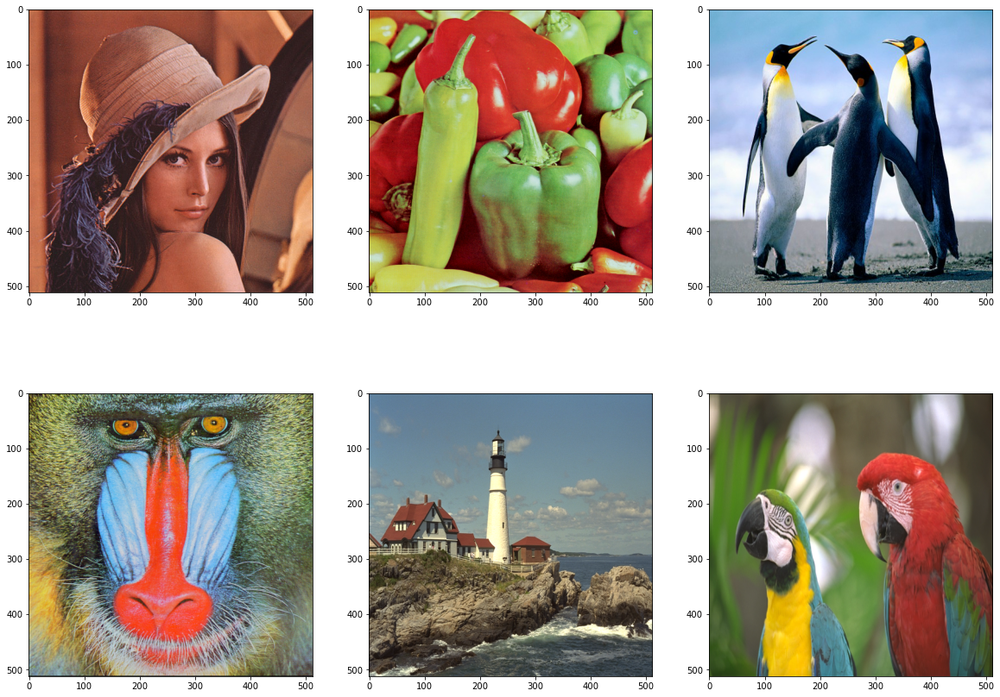

In [9]:
from skimage import io, color, measure
import matplotlib.pyplot as plt
import numpy as np

dir_path = './images/'
img_names = ['lena_color_512.bmp', 'peppers_512.png', 'penguins_512.jpg',
             'baboon_512.png', 'lighthouse_512.bmp', 'parrots_512.bmp']

img_paths = [dir_path + _ for _ in img_names]

fig = plt.figure(figsize=(20, 15))

for i, img_path in enumerate(img_paths):
    img = io.imread(img_path)
    fig.add_subplot(2,3,i+1); plt.imshow(img)

## Definirea functiei de zgomot impulsiv (sare si piper) si aplicarea acesteia pe imagini

In [6]:
def sp_noise(img_orig, ratio = 0.1):
    img = img_orig.copy()
    l, c, ch = img.shape
    length = int(l * c * ratio)
    lin = np.random.randint(0, l, [length])
    col = np.random.randint(0, c, [length])
    up_down = np.random.randint(0, 2, [length])
    for i in range(length):
        img[lin[i], col[i], np.random.randint(0, 3)] = 255 * up_down[i]
    return img

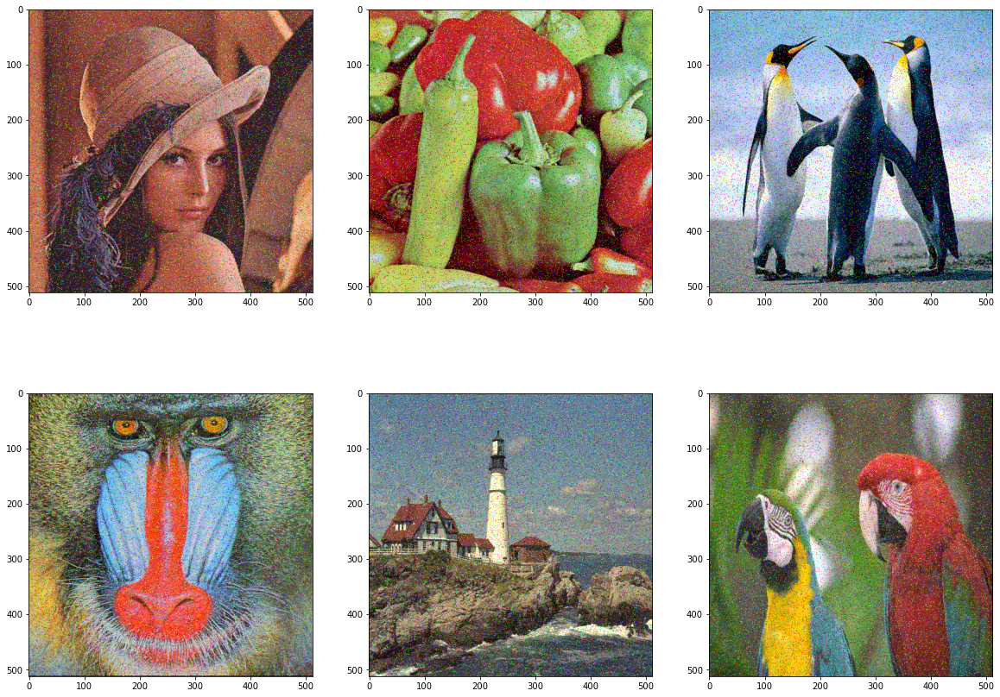

In [10]:
prob = 0.3

fig = plt.figure(figsize=(20, 15))

for i, img_path in enumerate(img_paths):
    img = io.imread(img_path)
    img_noise = sp_noise(img, prob)
    fig.add_subplot(2,3,i+1); plt.imshow(img_noise)

## Implementarea filtrelor median clasic si SWM (Switching Median Filter)

### Filtrul median clasic

In [5]:
def median_filter(img):
    img_out = img.copy()
    
    l, c, ch = img_out.shape
    for k in range(ch):
        for i in range(1, l - 2):
            for j in range(1, c - 2):
                V = np.sort(img[i-1:i+2, j-1:j+2, k], axis = None)
                img_out[i, j, k] = V[4]
                
    return img_out.astype(np.uint8)

### Filtrul median "comutativ" (Switching Median Filter - SWM)
Filtrul SWM este mai eficient în eliminarea zgomotului de impuls și păstrarea caracteristicilor imaginii. Filtrul înlocuiește un pixel deteriorat de valoarea mediană sau de valoarea procesată a pixelului învecinat. Pixelii necorupți sunt lăsați nemodificați[2].

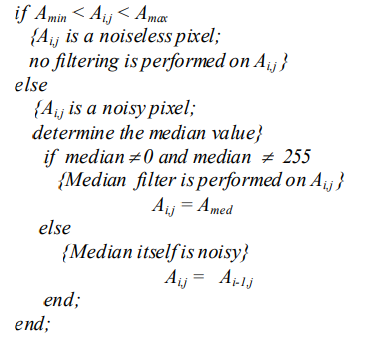

unde, $A_{ij}$ este intensitatea pixelului central din fereastra de filtrare, $A_min$, $A_max$ și $A_med$ sunt valoarea minimă, maximă și medie a pixelilor din fereastra de filtrare a imaginii zgomotoase. $A_{i-1, j}$ este intensitatea pixelului imediat vecin, deja procesat.

[2] *Pushpavalli, R., and G. Sivaradje. "Switching median filter for Image Enhancement." International Journal of Scientific & Engineering Research 3.2 (2012): 1-5.
Sursa: https://www.ijser.org/researchpaper/switching-median-filter-for-image-enhancement.pdf*

In [4]:
def swm_filter(img):
    img_out = img.copy()
    
    l, c, ch = img_out.shape
    for k in range(ch):
        for i in range(1, l - 2):
            for j in range(1, c - 2):    
                V = np.sort(img[i-1:i+2, j-1:j+2, k], axis = None)
                V_min, V_max = V[0], V[-1]
                
                if V_min < img_out[i, j, k] < V_max:
                    pass # no filtering needed
                else:
                    median = V[4]
                    if median != V_min and median != V_max:
                        img_out[i, j, k] = V[4]
                    else:
                        img_out[i, j, k] = img_out[i-1, j, k]
                
    return img_out.astype(np.uint8)

### Aplicarea filtrelor clasic median si SWM pe o imagine

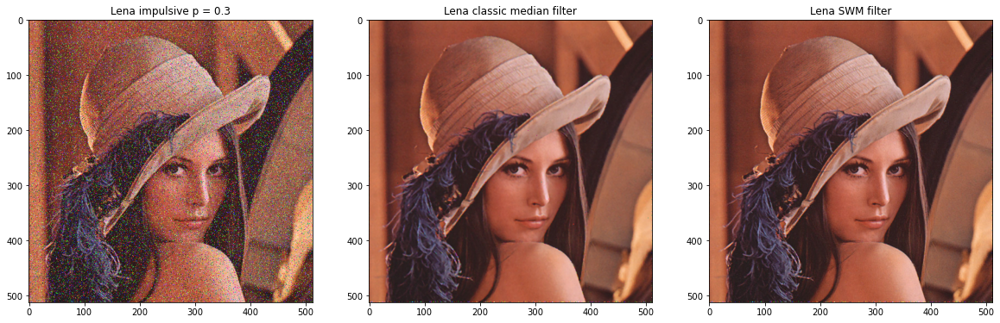

In [8]:
path = './images/'
img_path = path+'lena_color_512.bmp'

prob = 0.3

img = io.imread(img_path)
img_noise = sp_noise(img, prob)

img_median = median_filter(img_noise)
img_swm = swm_filter(img_noise)

fig = plt.figure(figsize=(20, 15))
fig.add_subplot(1,3,1).set_title(f'Lena impulsive p = {prob}'); plt.imshow(img_noise)
fig.add_subplot(1,3,2).set_title('Lena classic median filter'); plt.imshow(img_median)
fig.add_subplot(1,3,3).set_title('Lena SWM filter'); plt.imshow(img_swm)

## Implementarea filtrului ASWM (din articol)

Filtrul ASWM nu necesită un prag a priori ca în cazul unui filtru clasic de mediere comutativ. În schimb, pragul este calculat local din valorile intensității pixelilor imaginii într-o fereastră glisantă. Rezultatele arată că ASWM oferă o performanță mai bună în termeni de PSNR și MAE decât multe alte variante de filtru median pentru zgomotul impulsului evaluat aleatoriu. În plus, poate păstra mai multe detalii de imagine într-un mediu cu zgomot ridicat.

Pentru filtrul ASWM, valoarea medie ponderată și deviația standard ponderată sunt estimate în fereastra curentă. Greutățile sunt inversul distanței dintre valoarea medie ponderată a pixelilor dintr-o fereastră dată și pixelul considerat. Ca rezultat, zgomotul impulsiv nu corupe determinarea acestor statistici din care se derivă pragul.

În fiecare fereastră, media ponderată este mai întâi estimată iterativ. Apoi se calculează abaterea standard ponderată și se determină pragul.



In [3]:
def ASWM_filter(img, delta = 0.1, error = 0.01):
    img_out = img.copy()
    l, c, ch = img_out.shape
    
    for k in range(ch):
        for i in range(1, l - 2):
            for j in range(1, c - 2):
                alpha = 20
                window = img[i-1:i+2, j-1:j+2, k]
                
                # Initialization
                weights = np.array([[[1] * 3] * 3])
                windowMean = np.sum(np.multiply(weights, window)) / np.sum(weights)
                    
                while True:
                    windowMeanOld = windowMean
                    
                    # Step 1: Estimate the weights
                    weights = 1 / (np.abs((window - windowMean)) + delta)
                    windowMean = np.sum(np.multiply(weights, window)) / np.sum(weights)
                    
                    # Step 2 condtion
                    if np.abs(windowMean - windowMeanOld) < error:
                        break
                    alpha *= 0.8
                
                windowStdDeviation = np.sqrt(np.sum(np.multiply(weights, (window - windowMean)**2)) / np.sum(weights))
                
                if np.abs(img_out[i, j, k] - windowMean) > (alpha * windowStdDeviation):
                    img_out[i, j, k] = np.sort(window, axis = None)[4]
                else:
                    img_out[i, j, k] = img_out[i, j, k]
                
    return img_out.astype(np.uint8)

Testare filtru ASWM pe o imagine de dimensiune mică (`64 x 64`) / Debug

In [137]:
from datetime import datetime
tic = datetime.now()

path = './images/'
img_path = path+'lena_color_64.bmp'

img = io.imread(img_path)
img_noise = sp_noise(img, 0.3)

ASWM_filter(img_noise)
print(f'Duration: {datetime.now() - tic}')

Duration: 0:00:04.789234


### Aplicarea filtrului ASWM pe o imagine

Duration: 0:04:53.220245


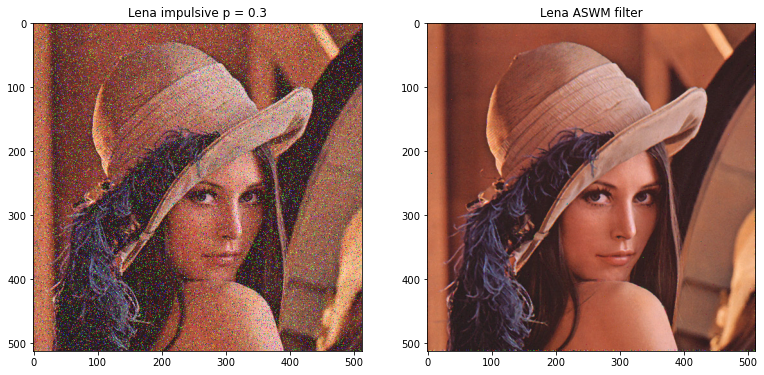

In [136]:
from datetime import datetime
tic = datetime.now()

path = './images/'
img_path = path+'lena_color_512.bmp'

prob = 0.3

img = io.imread(img_path)
img_noise = sp_noise(img, prob)

img_ASWM = ASWM_filter(img_noise)

fig = plt.figure(figsize=(20, 15))
fig.add_subplot(1,2,1).set_title(f'Lena impulsive p = {prob}'); plt.imshow(img_noise)
fig.add_subplot(1,2,2).set_title('Lena ASWM filter'); plt.imshow(img_ASWM)

print(f'Duration: {datetime.now() - tic}')

## Functii pentru masurarea zgomotului (PSNR, MAE)

In [11]:
# Mean squared error
def mse(imgInit, imgFinal): 
    r = np.asarray(imgInit, dtype=np.float64).ravel()
    c = np.asarray(imgFinal, dtype=np.float64).ravel()
    return np.mean(np.abs(r - c)**2)

# Peak signal-to-noise ratio
def PSNR(imgInit, imgFinal):
    rng = imgInit.max() - imgFinal.min()
    dv = (rng + 0.0)**2
    with np.errstate(divide='ignore'):
        rt = dv / mse(imgInit, imgFinal)
    return 10.0 * np.log10(rt)

# Mean absolute error
def MAE(imgInit, imgFinal):  
    r = np.asarray(imgInit, dtype=np.float64).ravel()
    c = np.asarray(imgFinal, dtype=np.float64).ravel()
    return np.mean(np.abs(r - c))

## Compararea celor 3 filtre: Median, SWM, ASWM

./images/lena_color_512.bmp, Total duration: 0:04:42.304317
Median_PSNR = 29.902 dB, Median_MAE = 3.832
SWM_PSNR = 32.153 dB, SWN_MAE = 1.451
ASWM_PSNR = 30.783 dB, ASWM_MAE = 2.012

./images/peppers_512.png, Total duration: 0:04:44.095533
Median_PSNR = 29.134 dB, Median_MAE = 4.044
SWM_PSNR = 30.474 dB, SWN_MAE = 1.789
ASWM_PSNR = 30.011 dB, ASWM_MAE = 2.109

./images/penguins_512.jpg, Total duration: 0:04:21.791418
Median_PSNR = 28.246 dB, Median_MAE = 3.530
SWM_PSNR = 30.464 dB, SWN_MAE = 1.585
ASWM_PSNR = 28.837 dB, ASWM_MAE = 2.279

./images/baboon_512.png, Total duration: 0:04:56.613534
Median_PSNR = 22.448 dB, Median_MAE = 11.728
SWM_PSNR = 25.895 dB, SWN_MAE = 4.102
ASWM_PSNR = 23.193 dB, ASWM_MAE = 8.285

./images/lighthouse_512.bmp, Total duration: 0:04:54.585358
Median_PSNR = 27.315 dB, Median_MAE = 4.807
SWM_PSNR = 28.982 dB, SWN_MAE = 2.044
ASWM_PSNR = 28.085 dB, ASWM_MAE = 2.950

./images/parrots_512.bmp, Total duration: 0:04:56.825450
Median_PSNR = 32.475 dB, Median_MAE 

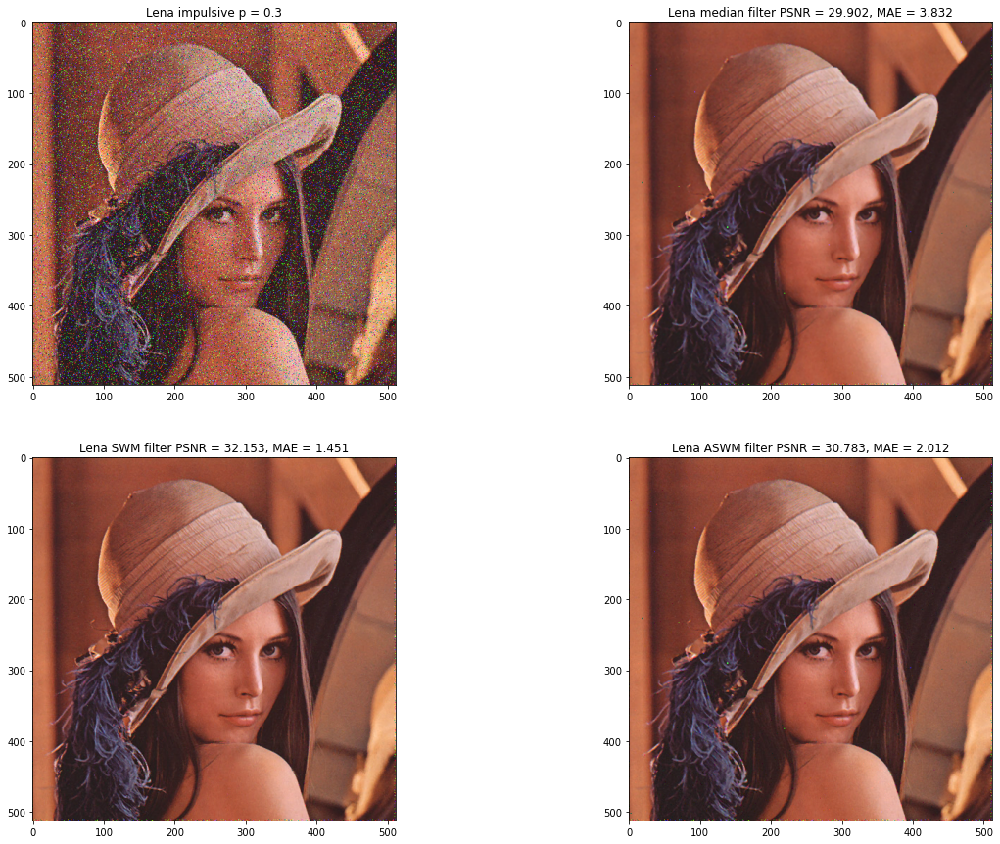

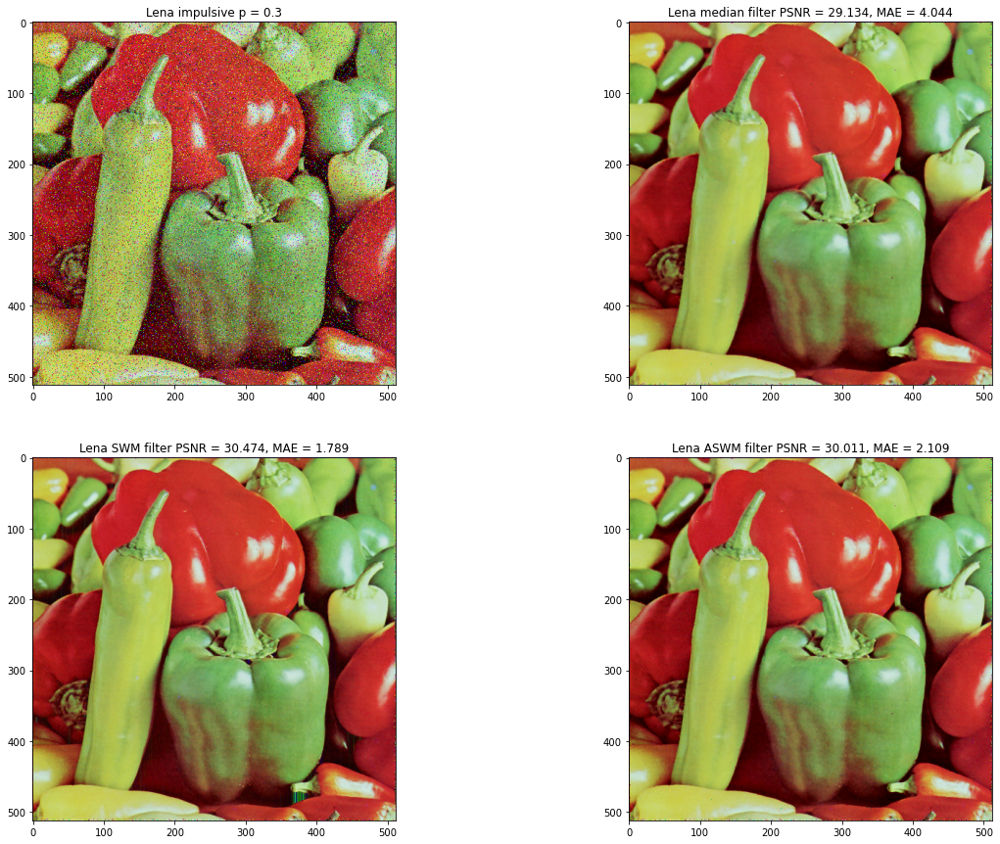

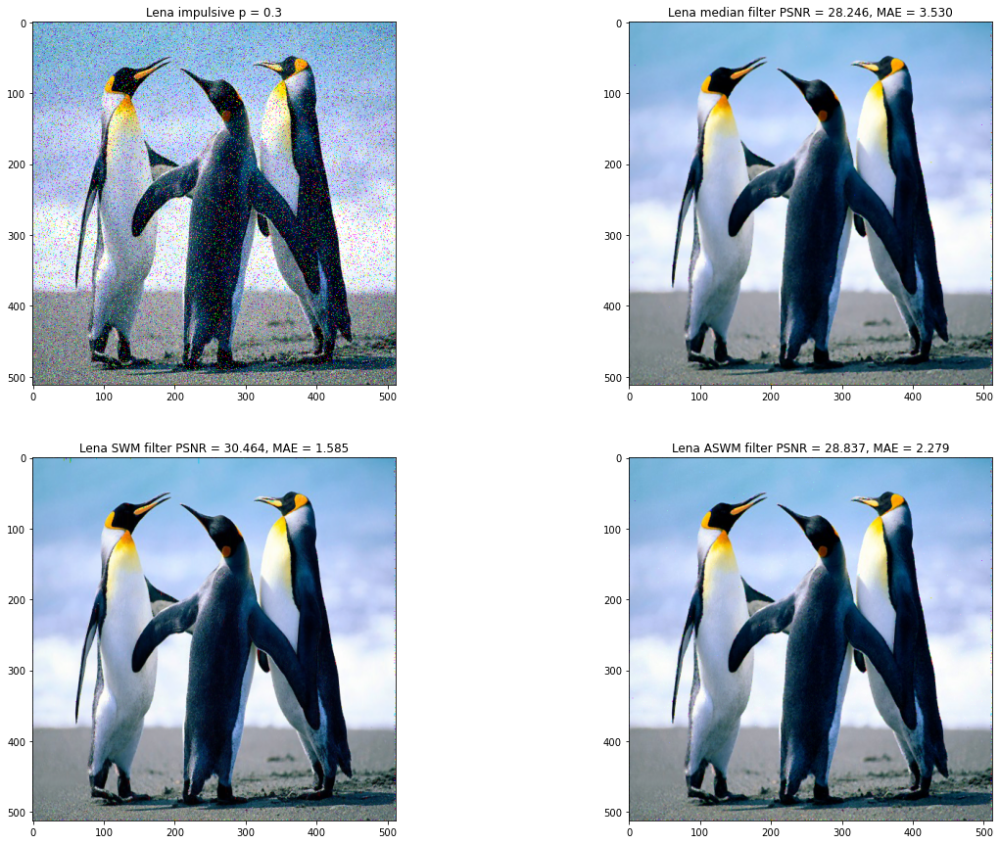

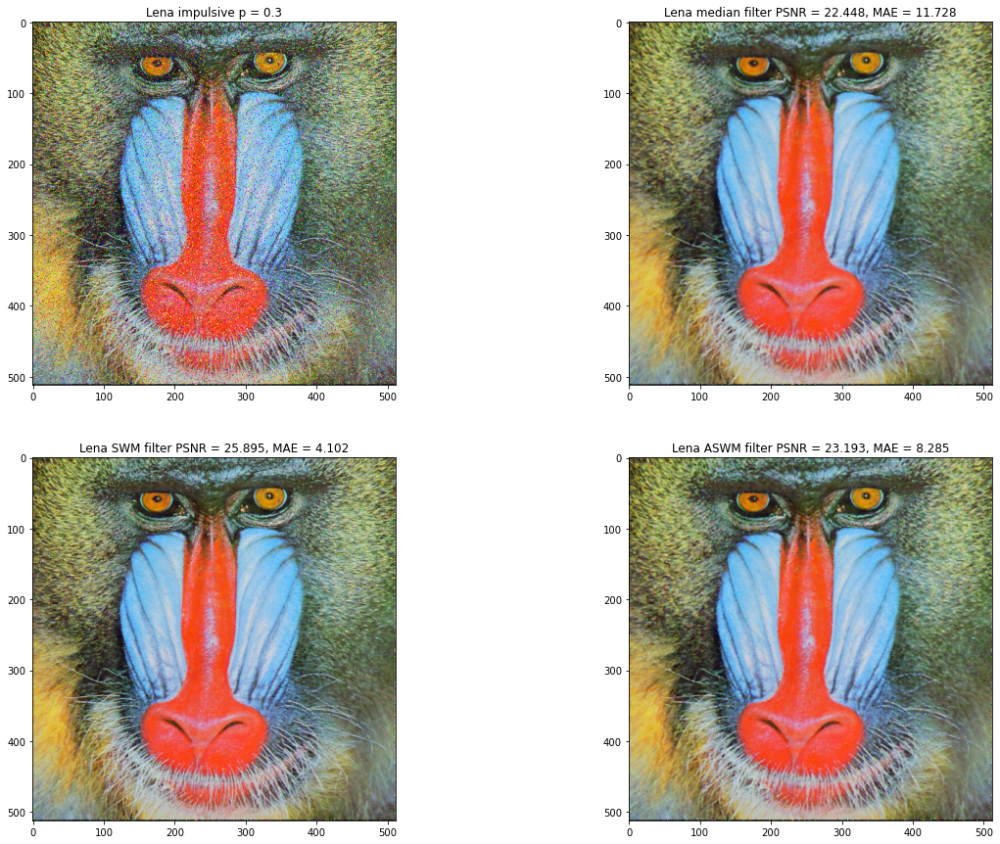

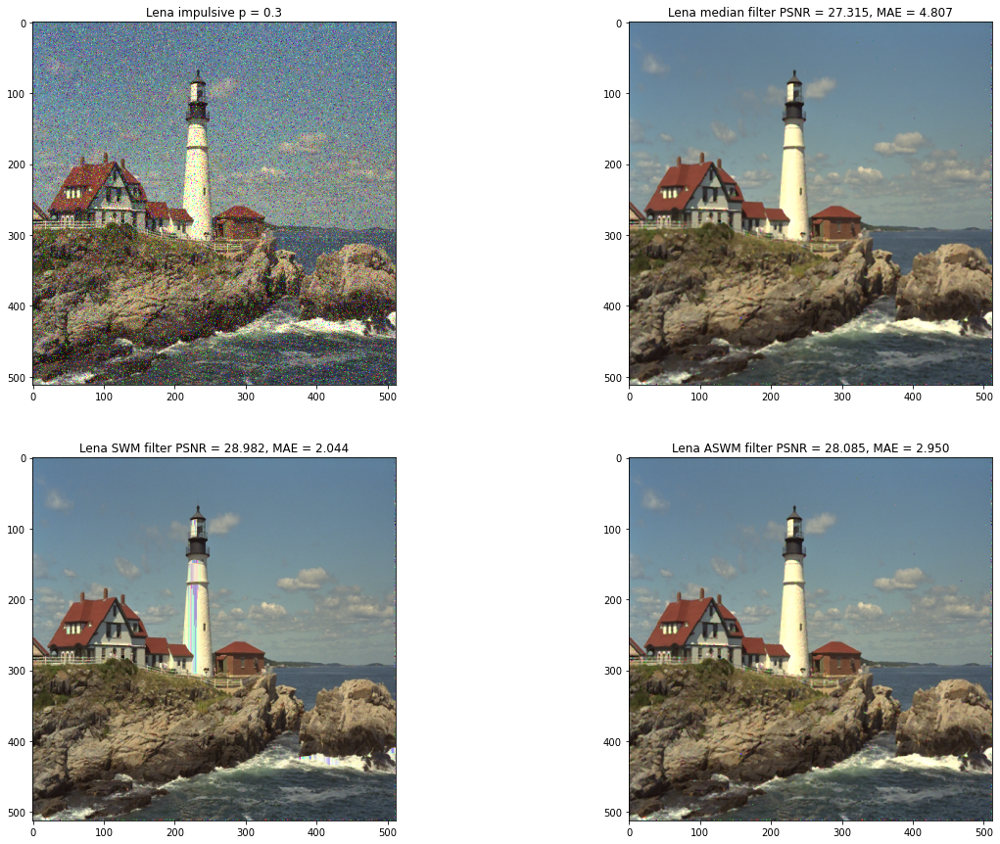

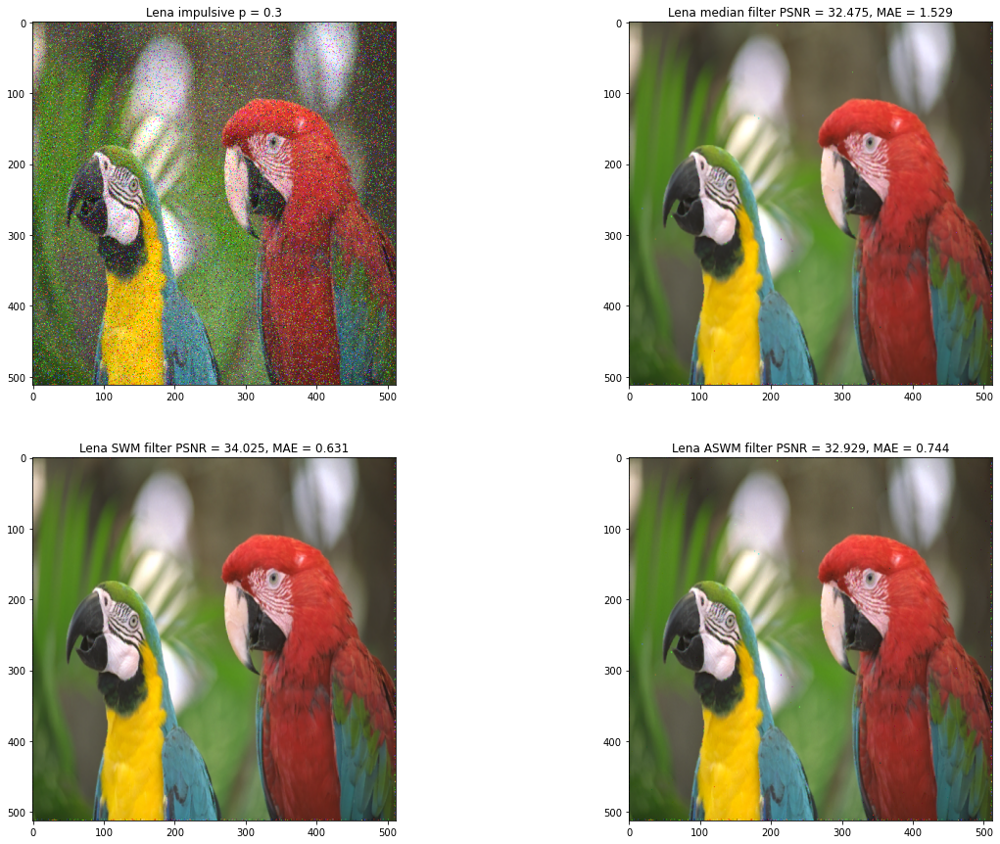

In [12]:
from datetime import datetime

dir_path = './images/'
img_names = ['lena_color_512.bmp', 'peppers_512.png', 'penguins_512.jpg',
             'baboon_512.png', 'lighthouse_512.bmp', 'parrots_512.bmp']
img_paths = [dir_path + _ for _ in img_names]

prob = 0.3

for img_path in img_paths:
    tic = datetime.now()
    
    img = io.imread(img_path)
    img_noise = sp_noise(img, prob)
    
    img_median = median_filter(img_noise)
    img_swm = swm_filter(img_noise)
    img_ASWM = ASWM_filter(img_noise)
    
    img_median_PSNR = PSNR(img, img_median)
    img_median_MAE = MAE(img, img_median)
    
    img_swm_PSNR = PSNR(img, img_swm)
    img_swm_MAE = MAE(img, img_swm)
    
    img_ASWM_PSNR = PSNR(img, img_ASWM)
    img_ASWM_MAE = MAE(img, img_ASWM)
    
    fig = plt.figure(figsize=(20, 15))
    fig.add_subplot(2,2,1).set_title(f'impulsive p = {prob}'); plt.imshow(img_noise)
    fig.add_subplot(2,2,2).set_title(f'median filter PSNR = {img_median_PSNR:.3f}, MAE = {img_median_MAE:.3f}');
    plt.imshow(img_median)
    fig.add_subplot(2,2,3).set_title(f'SWM filter PSNR = {img_swm_PSNR:.3f}, MAE = {img_swm_MAE:.3f}');
    plt.imshow(img_swm)
    fig.add_subplot(2,2,4).set_title(f'ASWM filter PSNR = {img_ASWM_PSNR:.3f}, MAE = {img_ASWM_MAE:.3f}');
    plt.imshow(img_ASWM)
    
    toc = datetime.now()
    print(f'{img_path}, Total duration: {toc - tic}')
    print(f'Median_PSNR = {img_median_PSNR:.3f} dB, Median_MAE = {img_median_MAE:.3f}')
    print(f'SWM_PSNR = {img_swm_PSNR:.3f} dB, SWN_MAE = {img_swm_MAE:.3f}')
    print(f'ASWM_PSNR = {img_ASWM_PSNR:.3f} dB, ASWM_MAE = {img_ASWM_MAE:.3f}\n')

## Rezultate
Având valorile PSNR, MAE pentru fiecare din imaginile afișate, putem întocmi următorul tabel:

| Image / Filter |           | Median | SWM    | ASWM   |
|----------------|-----------|--------|--------|--------|
| lena_color_512 | PSNR (dB) | 29.902 | 32.153 | 30.783 |
|                | MAE       | 3.832  | 1.451  | 2.012  |
| peppers_512    | PSNR (dB) | 29.134 | 30.474 | 30.011 |
|                | MAE       | 4.044  | 1.789  | 2.109  |
| penguins_512   | PSNR (dB) | 28.246 | 30.464 | 28.837 |
|                | MAE       | 3.53   | 1.585  | 2.279  |
| baboon_512     | PSNR (dB) | 22.448 | 25.895 | 23.193 |
|                | MAE       | 11.728 | 4.102  | 8.285  |
| lighthouse_512 | PSNR (dB) | 27.315 | 28.982 | 28.085 |
|                | MAE       | 4.807  | 2.044  | 2.95   |
| parrots_512    | PSNR (dB) | 32.475 | 34.025 | 32.929 |
|                | MAE       | 1.529  | 0.631  | 0.744  |

<center>Results with a probabilty of 30% random-valued impulsive noise</center>

## Concluzii

### Rezultate
Din tabelul afisat anterior, putem observa ca filtrul SWM este cel mai bun

### Distorsiuni
Cu toate ca filtrul SWM 'e cel mai bun/filtreaza cel mai bn imaginea', se pot observa aparitia unor distorsiuni in cazul unor imagini. Spre exemplu lighthouse... Distorsiunile pot aparea de la faptul ca se preia nivelul de luminanta al pixelului anterior..

### Imagini cu nivele de gri vs color
Algoritmul din articol a fost implementat doar pentru a filtra imaginile cu nivele de gri, un motiv pt care nu ar trebui sa ne asteptam la rezultate exceptionale (sau neaparat mai bune) in privinta imaginilor color.

Totodata, din acest motiv, rezultatele valorilor PSNR, MAE din articol pot diferi fata de rezultatele obtinute anterior.

### Performante
Filtrul ASWM este cel slab din punct de vedere al performantei... Calculul aditional adus de calcularea iterativa a greutatilor si a mediei precum si a deviatiei standard pentru fiecare fereasta, aduce costuri computationale imense, comparativ cu filtrele median clasic si SWM.



## Bibliografie
[1] *Akkoul, Smaïl, et al. "A new adaptive switching median filter." IEEE Signal Processing Letters 17.6 (2010): 587-590.<br/>
Link: https://ieeexplore.ieee.org/abstract/document/5451149*

[2] *Pushpavalli, R., and G. Sivaradje. "Switching median filter for Image Enhancement." International Journal of Scientific & Engineering Research 3.2 (2012): 1-5.<br/>
Link: https://www.ijser.org/researchpaper/switching-median-filter-for-image-enhancement.pdf*